In [69]:
import argparse
import os
from tqdm import tqdm
import torch
import numpy as np
from numpy import linalg
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from collections import defaultdict
from PIL import Image
import math
import pickle
import sys

import torch
from torch.utils import data
from torch.utils.data.dataloader import default_collate
from torch.autograd import Variable
import torchvision.transforms as transforms


from models.unet import UNet

In [95]:
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/49j20rhe/last.ckpt'
# pretrained_weights_path = '/scratch/ainaz/XTConsistency/models/rgb2normal_baseline.pth'

# tiny taskonomy
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/34utml3m/epoch=89.ckpt'

# # replica
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/2il2rz67/epoch=471.ckpt'

# # hypersim
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/25fqdadh/epoch=492.ckpt'

# # GSO
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/3dh5jks3/epoch=158.ckpt'

# # tiny taskonomy + replica
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/27ofkw0o/epoch=92.ckpt'

# # tiny taskonomy + replica + hypersim
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/3kmfynk3/epoch=51.ckpt'

# # tiny taskonomy + replica + hypersim + gso
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/1kmpfjak/epoch=45.ckpt'
pretrained_weights_path = '/scratch/ainaz/omnidata2/exps/checkpoints/omnidata/3ef56j3n/epoch=157.ckpt'


In [96]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = UNet(in_channels=3, out_channels=3)

checkpoint = torch.load(pretrained_weights_path, map_location='cuda:0')
if 'state_dict' in checkpoint:
    state_dict = {}
    for k, v in checkpoint['state_dict'].items():
        state_dict[k.replace('model.', '')] = v
else:
      state_dict = checkpoint
model.load_state_dict(state_dict)
model.to(device)
model.eval()

UNet(
  (down1): UNet_down_block(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): GroupNorm(8, 16, eps=1e-05, affine=True)
    (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): GroupNorm(8, 16, eps=1e-05, affine=True)
    (conv3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): GroupNorm(8, 16, eps=1e-05, affine=True)
    (max_pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (relu): ReLU()
  )
  (down_blocks): ModuleList(
    (0): UNet_down_block(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): GroupNorm(8, 32, eps=1e-05, affine=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): GroupNorm(8, 32, eps=1e-05, affine=True)
      (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn3): GroupNorm(8, 32, eps=1e-05, affine=True)


# Dataloader

In [97]:
class OASISNormalDataset(data.Dataset):
    def __init__(self, csv_filename, data_aug=False, img_size=256):
        super(OASISNormalDataset, self).__init__()
        print("=====================================================")
        print("Using OASISNormalDataset...")
        print("csv file name: %s" % csv_filename)

        img_names = []
        normal_names = []

        with open(csv_filename) as infile:
            next(infile) # skip header
            for line in infile:
                # Filenames are absolute directories
                img_name,_,_,normal_name,_,_,_,_,_,_,_,_,_,_ = line.split(',')
                if len(normal_name) == 0:
                    continue
                img_names.append(os.path.join('/scratch/ainaz', img_name.strip()))
                normal_names.append(os.path.join('/scratch/ainaz', normal_name.strip()))
    
        self.img_names = img_names
        self.normal_names = normal_names
        self.width = img_size #320
        self.height = img_size #240
        self.n_sample = len(self.img_names)

        self.data_aug = data_aug
        print("Network input width = %d, height = %d" % (self.width, self.height))
        print("%d samples" % (self.n_sample))
        print("Data augmentation: {}".format(self.data_aug))
        print("=====================================================")

    def __getitem__(self, index):
        color = cv2.imread(self.img_names[index]).astype(np.float32)
        normal_file = open(self.normal_names[index], 'rb')
        normal_dict = pickle.load(normal_file)


        h,w,c = color.shape
        mask = np.zeros((h,w))
        normal = np.zeros((h,w,c))

        # Stuff ROI normal into bounding box
        min_y = normal_dict['min_y']
        max_y = normal_dict['max_y']
        min_x = normal_dict['min_x']
        max_x = normal_dict['max_x']
        roi_normal = normal_dict['normal']
        try:
            normal[min_y:max_y+1, min_x:max_x+1, :] = roi_normal
            normal = normal.astype(np.float32)
        except Exception as e:
            print("Error:", self.normal_names[index])
            print(str(e))
            return 

        # Make mask
        roi_mask = np.logical_or(np.logical_or(roi_normal[:,:,0] != 0, roi_normal[:,:,1] != 0), roi_normal[:,:,2] != 0).astype(np.float32)

        mask[min_y:max_y+1, min_x:max_x+1] = roi_mask


        orig_height = color.shape[0]
        orig_width = color.shape[1]
        # Downsample training images
        color = cv2.resize(color, (self.width, self.height))
        mask = cv2.resize(mask, (self.width, self.height))
        normal = cv2.resize(normal, (self.width, self.height))

        # Data augmentation: randomly flip left to right
        if self.data_aug:
            if random.random() < 0.5:
                color = cv2.flip(color, 1)
                normal = cv2.flip(normal, 1)
                # make sure x coordinates of each vector get flipped
                normal[:,:,0] *= -1

        color = np.transpose(color, (2, 0, 1)) / 255.0  # HWC to CHW.
        normal = np.transpose(normal, (2, 0, 1))   # HWC to CHW.
        # Add one channel b/c Pytorch interpolation requires 4D tensor
        mask = mask[np.newaxis, :, :]

        return color, normal, mask, (orig_height, orig_width)

    def __len__(self):
        return self.n_sample


class OASISNormalDatasetVal(OASISNormalDataset):
    def __init__(self, csv_filename, data_aug=False):
        print("+++++++++++++++++++++++++++++++++++++++++++++++")
        print("Using OASISNormalDatasetVal...")
        print("csv file name: %s" % csv_filename)
        OASISNormalDataset.__init__(self, csv_filename, data_aug=data_aug)

    def __getitem__(self, index):
#         color = cv2.imread(self.img_names[index]).astype(np.float32)
        color = np.array(Image.open(self.img_names[index])).astype(np.float32) # my code
        normal_file = open(self.normal_names[index], 'rb')
        normal_dict = pickle.load(normal_file)
        
        if len(color.shape) < 3:
            print("://")
            color = np.expand_dims(color, axis=2)
            color = np.repeat(color, 3, axis=2)

        h,w,c = color.shape
        mask = np.zeros((h,w))
        normal = np.zeros((h,w,c))

        # Stuff ROI normal into bounding box
        min_y = normal_dict['min_y']
        max_y = normal_dict['max_y']
        min_x = normal_dict['min_x']
        max_x = normal_dict['max_x']
        roi_normal = normal_dict['normal']
        try:
            normal[min_y:max_y+1, min_x:max_x+1, :] = roi_normal
            normal = normal.astype(np.float32)
        except Exception as e:
            print("Error:", self.normal_names[index])
            print(str(e))
            return 

        # Make mask
        roi_mask = np.logical_or(np.logical_or(roi_normal[:,:,0] != 0, roi_normal[:,:,1] != 0), roi_normal[:,:,2] != 0).astype(np.float32)

        mask[min_y:max_y+1, min_x:max_x+1] = roi_mask

        orig_height = color.shape[0]
        orig_width = color.shape[1]

        ############ my code
        orig_height = min(color.shape[0], color.shape[1])
        orig_width = min(color.shape[0], color.shape[1])
        center_x = (min_x + max_x) // 2
        center_y = (min_y + max_y) // 2
        h, w = orig_height, orig_width
        if h < w:
            if center_x > w // 2: 
                color = color[0:h, w-h:w]
                mask = mask[0:h, w-h:w]
                normal = normal[0:h, w-h:w]
            else: 
                color = color[0:h, 0:h]
                mask = mask[0:h, 0:h]
                normal = normal[0:h, 0:h]
        else:
            if center_y > h // 2: 
                color = color[h-w:h, 0:w]
                mask = mask[h-w:h, 0:w]
                normal = normal[h-w:h, 0:w]
            else: 
                color = color[0:w, 0:w]
                mask = mask[0:w, 0:w]
                normal = normal[0:w, 0:w]
        ####################

        # Downsample training images
        color = cv2.resize(color, (self.width, self.height))
        color = np.transpose(color, (2, 0, 1)) / 255.0  # HWC to CHW.
        normal = np.transpose(normal, (2, 0, 1))   # HWC to CHW.
        
        # Add one channel b/c Pytorch interpolation requires 4D tensor
        mask = mask[np.newaxis, :, :]

        return color, normal, mask, (orig_height, orig_width), self.img_names[index]

    def __len__(self):
        return self.n_sample

In [98]:
test_file = '/scratch/ainaz/OASIS/OASIS_trainval/OASIS_val.csv'
collate_fn = default_collate
DataSet = OASISNormalDatasetVal
dataset_name = 'OASISNormalDatasetVal'
test_dataset = DataSet(csv_filename = test_file)
test_data_loader = data.DataLoader(test_dataset, batch_size=1, num_workers=1, shuffle=False, collate_fn = collate_fn)

+++++++++++++++++++++++++++++++++++++++++++++++
Using OASISNormalDatasetVal...
csv file name: /scratch/ainaz/OASIS/OASIS_trainval/OASIS_val.csv
Using OASISNormalDataset...
csv file name: /scratch/ainaz/OASIS/OASIS_trainval/OASIS_val.csv
Network input width = 256, height = 256
10000 samples
Data augmentation: False


(3, 256, 256)


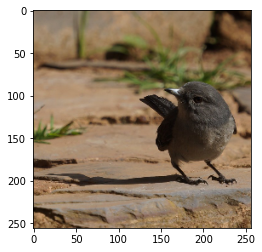

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


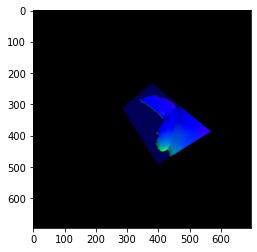

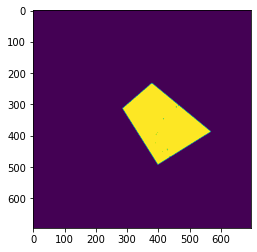

In [99]:
rgb, normal, mask, orig_size, name = test_dataset[10]
print(rgb.shape)
plt.imshow(rgb.transpose(1,2,0))
plt.show()
plt.imshow(normal.transpose(1,2,0))
plt.show()
plt.imshow(mask.transpose(1,2,0))
plt.show()


# Absolute normal evaluation

In [100]:

def valid(model, coord_change, data_loader, dataset_name, max_iter=1400, 
          verbal=False, b_vis_normal=False, in_thresh = None, front_facing = False):
    print("Evaluation on {}".format(dataset_name))

    # NYU: x points left, y points down, z points toward us
    # SNOW: x points right, y points up, z points toward us
    # OASIS: x points right, y points down, z points toward us

    return valid_normals(model, 'OASIS', coord_change, data_loader, max_iter, verbal, front_facing, b_vis_normal)

def vis_normal(rgb, pred, gt):

    rgb = rgb * 255.0
    gt = gt * 255.0
    pred = pred * 255.0
    
    im = np.concatenate([rgb, gt, pred], axis=1)
    
#     if not is_color:
#         # BGR -> RGB
#         im = im[:,:,[2,1,0]]
    plt.figure(figsize=(16, 8))
    plt.imshow(np.uint8(im))
    plt.show()

def valid_normals(model, type, coord_change, data_loader, max_iter, verbal, front_facing = False, b_vis_normal = False):
    def angle_error(preds, truths):
        '''
        preds and truths: Nx3 pytorch tensor
        '''
        preds_norm =  torch.nn.functional.normalize(preds, p=2, dim=1)
        truths_norm = torch.nn.functional.normalize(truths, p=2, dim=1)
        angles = torch.sum(preds_norm * truths_norm, dim=1)
                
        # Clip values so that max is 1 and min is -1, but don't change intermediate values
        angles = torch.clamp(angles, -1, 1)
        angles = torch.acos(angles)
        return angles

    # In degrees
    def mean(errors):
        error_sum = 0
        total_pixels = 0
        for matrix in errors:
            error_sum += np.sum(matrix)
            total_pixels += matrix.size
        return math.degrees(error_sum / total_pixels)

    # In degrees
    def median(errors):
        return math.degrees(np.median(np.concatenate(errors)))
  
    # 11.25, 22.5, 30
    def below_threshold(errors, thresh_angle):
        num = 0
        total_pixels = 0
        for matrix in errors:
            num += np.sum(matrix < math.radians(thresh_angle))
            total_pixels += matrix.size
        return num / total_pixels

  
    print("####################################")
    print("Evaluating...")
    print("\tfront_facing = %s"  %  front_facing)

    assert not model.training

    iter = 0
    with torch.no_grad():
        errors = []
        for step, data_tuple in enumerate(data_loader):
            if len(data_tuple) == 3:
                inputs, targets, target_res = data_tuple
            elif len(data_tuple) == 5:
                inputs, targets, masks, target_res, _ = data_tuple
                masks = masks.to(device)
            iter += 1
            if iter > max_iter:
                break
                
            input_var = Variable(inputs.to(device))
            output_var = model(input_var)
            
            #### blind guess
#             transform_blind = transforms.Compose([
#                 transforms.Resize(256, Image.NEAREST),
#                 transforms.ToTensor()
#             ])
#             blind = transform_blind(
#                 Image.open('/scratch/ainaz/omnidata2/blind_guesses/normal_taskonomy.png'))
#             output_var = blind.unsqueeze(0).cuda()
            ################
            
            targets = targets.to(device)
            

            # Shift coordinate systems
#             output_var[:,0,:,:] *= coord_change[0]
#             output_var[:,1,:,:] *= coord_change[1]
#             output_var[:,2,:,:] *= coord_change[2]

            ##### my code
            targets[:,0,:,:] *= coord_change[0]
            targets[:,1,:,:] *= coord_change[1]
            targets[:,2,:,:] *= coord_change[2]
            
            output_var = torch.clamp(output_var, 0, 1)
            targets = (targets + 1) / 2
            ############


            orig_height = target_res[0]
            orig_width = target_res[1]
            output_var = torch.nn.functional.interpolate(output_var, size=(orig_height, orig_width), mode='bilinear')
            targets = torch.nn.functional.interpolate(targets, size=(orig_height, orig_width), mode='bilinear')
            masks = torch.nn.functional.interpolate(masks, size=(orig_height, orig_width), mode='bilinear')
            mask = masks.byte().squeeze(1) # remove color channel        
            output_var = torch.nn.functional.normalize(output_var, p=2, dim=1)
            output = output_var.permute(0,2,3,1)[mask, :]
            target = targets.permute(0,2,3,1)[mask, :]

            if front_facing :
                output[:,0] = 0 # output: torch.Size([N, 3])
                output[:,1] = 0
                output[:,2] = 1

        
            error = angle_error(output, target)

            errors.append(error.data.cpu().detach().numpy())

#             if b_vis_normal and iter % 200 == 0:
#                 color = input_var[0,:,:,:].cpu().detach().numpy().transpose(1, 2, 0)
#                 pred = torch.clamp(output_var[0,:,:,:],0,1).cpu().detach().numpy().transpose(1, 2, 0)
#                 gt = targets[0,:,:,:].cpu().detach().numpy().transpose(1, 2, 0)
#                 color = cv2.resize(color, (orig_height, orig_width))
#                 vis_normal(color, pred, gt)


#             if iter % 50 == 0:
#                 print("Iter {}: {} mean radian error".format(iter, np.mean(np.concatenate(errors))))
#                 sys.stdout.flush()
              
        MAE = mean(errors)
        print("Mean angle error: {} degs".format(MAE))
        below_1125 = below_threshold(errors, 11.25)
        print("% below 11.25 deg: {}".format(below_1125))
        below_225 = below_threshold(errors, 22.5)
        print("% below 22.5 deg: {}".format(below_225))
        below_30 = below_threshold(errors, 30)
        print("% below 30 deg: {}".format(below_30))
        MDAE = median(errors)
        print("Median angle error: {} degs".format(MDAE))
        sys.stdout.flush()

        results = {}
        results['MAE'] = MAE
        results['MDAE'] = MDAE
        results['11.25'] = below_1125
        results['22.5'] = below_225
        results['30'] = below_30
        return results

In [101]:
num_iters = 10000
b_vis_normal = True
front_facing = False
in_thresh = 0.0
model.eval()
test_rel_error = valid(model, [1., 1., -1.], test_data_loader, dataset_name, 
                               max_iter = num_iters, in_thresh=in_thresh, b_vis_normal=b_vis_normal, 
                               verbal=True, front_facing=front_facing)

Evaluation on OASISNormalDatasetVal
####################################
Evaluating...
	front_facing = False


<ipython-input-100-729d51a5eb1c>:120: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /pytorch/aten/src/ATen/native/IndexingUtils.h:25.)
  output = output_var.permute(0,2,3,1)[mask, :]
<ipython-input-100-729d51a5eb1c>:121: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /pytorch/aten/src/ATen/native/IndexingUtils.h:25.)
  target = targets.permute(0,2,3,1)[mask, :]


://
Mean angle error: 17.841436090119362 degs
% below 11.25 deg: 0.3894651376295418
% below 22.5 deg: 0.7207118123544871
% below 30 deg: 0.8279933287406833
Median angle error: 14.092320356910754 degs


# Relative normal evaluation

In [102]:
# normalize normals
def normalize(normal_map):
    l2_norms = linalg.norm(normal_map, axis = 2)
    l2_norms = np.stack([l2_norms, l2_norms, l2_norms], axis = -1)
    return np.divide(normal_map, l2_norms)


def ang_diff(vec1, vec2):
    '''
        calculate the angle difference between two vectors
        return between 0 and pi, in radians
    '''
    dot_prod = np.dot(vec1, vec2)
    dot_prod = min(dot_prod, 1.0)
    dot_prod = max(dot_prod, -1.0)
    ang = math.acos(dot_prod)
    return ang

def precision_recall_perpen(ang_diffs, neither_ang_diffs):
    '''
    Get the recall curve for the perpendicular case.
    Threshold on (ang_diffs - math.pi / 2.0), i.e., distance to 90 degree
    Input
        ang_diffs: a list of angular difference measured in radian, supposed to be perpendicular
        neither_ang_diffs: a list of angular difference measured in radian, supposed to be not perpendicular
    Output:
        The AUC score for the recall curve.
        And a plot of the curve stored in "perpen.pdf"
    '''
    plt.clf()
    n_pos_sample = len(ang_diffs)
    n_neg_sample = len(neither_ang_diffs)
    # This will be either TP or FN
    np_ang_diffs = np.array(ang_diffs).copy()
    np_ang_diffs = [val for val in np.abs(np_ang_diffs - (math.pi / 2.0))] # dist to 90 degree

    # This will be either FP or TN
    np_neither_ang_diffs = np.array(neither_ang_diffs).copy()
    np_neither_ang_diffs = [val for val in np.abs(neither_ang_diffs - (math.pi / 2.0))] # dist to 90 degree

    # recall = [0, 0] # Needs at least two points to calculate area under the curve
    # precision = [1, 1]

    all_ang_diffs = np_ang_diffs + np_neither_ang_diffs
    all_ang_diffs = convert_ang_to_prob(all_ang_diffs)
    true_labels = [1 for i in range(n_pos_sample)] + [0 for i in range(n_neg_sample)]
    precision, recall, _= precision_recall_curve(true_labels, all_ang_diffs)
    AP = average_precision_score(true_labels, all_ang_diffs)

    plt.plot(recall, precision, 'b*-')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.xlim([0.0, 1.1])
    plt.ylim([0.0, 1.1])
    plt.title('Perpendicular Precision-Recall Curve: AP = %.2f' % (AP) )
    plt.savefig("Perpendicular.pdf", bbox_inches='tight')

    return AP

def precision_recall_parall(ang_diffs, neither_ang_diffs):
    '''
    Get the recall curve for the parallel case.
    Threshold on the ang_diffs.
    Input
        ang_diffs: a list of angular difference measured in radian, supposed to be parallel
        neither_ang_diffs: a list of angular difference measured in radian, suppose to be not parallel
    Output:
        The AUC score for the recall curve, i.e. AP
        And a plot of the curve stored in "parall.pdf"
    '''
    plt.clf()
    n_pos_sample = len(ang_diffs)
    n_neg_sample = len(neither_ang_diffs)

    # This will be either TP or FN
    np_ang_diffs_ali = np.array(ang_diffs).copy() # when two vectors point to the same direction
    np_ang_diffs_rev = np.pi - np.array(ang_diffs) # when two vectors point to the opposite direction
    np_ang_diffs = [min(np_ang_diffs_ali[i], np_ang_diffs_rev[i]) for i in range(len(np_ang_diffs_rev))]

    # This will be either FP or TN
    np_neither_ang_diffs_ali = np.array(neither_ang_diffs).copy() # when two vectors point to the same direction
    np_neither_ang_diffs_rev = np.pi - np.array(neither_ang_diffs) # when two vectors point to the opposite direction
    np_neither_ang_diffs = [min(np_neither_ang_diffs_ali[i], np_neither_ang_diffs_rev[i]) for i in range(len(np_neither_ang_diffs_rev))]

    # recall = [0, 0]  # Needs at least two points to calculate area under the curve
    # precision = [1, 1]

    all_ang_diffs = np_ang_diffs + np_neither_ang_diffs
    all_ang_diffs = convert_ang_to_prob(all_ang_diffs)
    true_labels = [1 for i in range(n_pos_sample)] + [0 for i in range(n_neg_sample)]
    precision, recall, _= precision_recall_curve(true_labels, all_ang_diffs)
    AP = average_precision_score(true_labels, all_ang_diffs)

    plt.plot(recall, precision, 'b*-')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.xlim([0.0, 1.1])
    plt.ylim([0.0, 1.1])
    plt.title('Parallel Precision-Recall Curve: AP= %.2f' % (AP) )
    plt.savefig("Parallel.pdf", bbox_inches='tight')

    return AP

# Angles are in range from 0 to pi radians. Note that the perpendicular function already subtracts by pi/2 radians so we don't have to
# To compute precision recall, you need probabilities.
# Error of pi radians -> prob of 0.
# Error of 0 radians -> prob of 1.
def convert_ang_to_prob(angles):
  for i in range(len(angles)):
    angles[i] = 1.0 - (angles[i] / math.pi)
  return angles


def get_ang_diffs(pred_normal, xyxyr_tups):
    assert(len(pred_normal.shape) == 3)
    assert(pred_normal.shape[2] == 3)

    NEITHER_REL = "neither" # REVIEW

    unit_pred_normal = normalize(pred_normal)
    ang_diffs = []
    for xyxyr in xyxyr_tups:
        x_A = xyxyr[0]
        y_A = xyxyr[1]
        x_B = xyxyr[2]
        y_B = xyxyr[3]
        rel = xyxyr[4]
        assert(rel == "parallel" or rel == "perpendicular" or rel == NEITHER_REL)

        norm_A = unit_pred_normal[y_A, x_A, :]
        norm_B = unit_pred_normal[y_B, x_B, :]

        ang_diffs.append(ang_diff(norm_A, norm_B))

    perpendi_idx = [i for i in range(len(xyxyr_tups)) if xyxyr_tups[i][4] == 'perpendicular']
    parallel_idx = [i for i in range(len(xyxyr_tups)) if xyxyr_tups[i][4] == 'parallel']
    neither_idx = [i for i in range(len(xyxyr_tups)) if xyxyr_tups[i][4] == NEITHER_REL]
    
    
    perpendi_ang_diffs = [ang_diffs[i] for i in perpendi_idx]
    parallel_ang_diffs = [ang_diffs[i] for i in parallel_idx]
    neither_ang_diffs  = [ang_diffs[i] for i in neither_idx]

    return perpendi_ang_diffs, parallel_ang_diffs, neither_ang_diffs


def eval_rel_normal_by_ang(perpendi_ang_diffs, parallel_ang_diffs, neither_ang_diffs):
    '''
    Evaluate the relative normals of a list of predicted normal maps.
    Input:
        perpendi_ang_diffs 
        parallel_ang_diffs
        neither_ang_diffs
    Output:
        Two curves: x axis is the threshold, y axis is the recall.
        The area under the curve for the perpendicular and parallel curves.
    '''

    perpendi_ang_diffs, parallel_ang_diffs, neither_ang_diffs = np.array(perpendi_ang_diffs), np.array(parallel_ang_diffs), np.array(neither_ang_diffs)
    perpendi_ang_diffs = perpendi_ang_diffs[~np.isnan(perpendi_ang_diffs)]
    parallel_ang_diffs = parallel_ang_diffs[~np.isnan(parallel_ang_diffs)]
    neither_ang_diffs = neither_ang_diffs[~np.isnan(neither_ang_diffs)]

    perpendi_AP = precision_recall_perpen(perpendi_ang_diffs, neither_ang_diffs)
    parallel_AP = precision_recall_parall(parallel_ang_diffs, neither_ang_diffs)

    return perpendi_AP, parallel_AP


def eval_rel_normal(list_pred_normal, list_xyxyr_tups):
    '''
    Evaluate the relative normals of a list of predicted normal maps.
    Input:
        list_pred_normal: a list of numpy arrays HxWx3. The  predicted normal maps .
                          Does not assumed to be unit-normalized
                    [
                        normal map1,
                        normal map2,
                        ...
                    ]
        list_xyxyr_tups : a list of list of tuples (x_A, y_A, x_B, y_B, relation)
                    relation can be either "parallel", "perpendicular" or "neither"
                    [
                        [(x_A, y_A, x_B, y_B, relation), (x_A, y_A, x_B, y_B, relation), ...],  # for 1st normal map
                        [(x_A, y_A, x_B, y_B, relation), (x_A, y_A, x_B, y_B, relation), ...],  # for 2nd normal map
                        ...
                    ]
        snap_thresh_parall: beyond this thresh is no longer considered as parallel
        snap_thresh_perpen: beyond this thresh (i.e., distance to 90 degree) is no longer considered as perpendicular
    Output:
        Two curves: x axis is the threshold, y axis is the recall.
        The area under the curve for the perpendicular and parallel curves.
    '''

    assert(len(list_pred_normal) == len(list_xyxyr_tups))

    perpendi_ang_diffs = []
    parallel_ang_diffs = []
    neither_ang_diffs = []
    for pred_normal, xyxyr_tups in zip(list_pred_normal, list_xyxyr_tups):
        _perpendi, _parallel, _neither = get_ang_diffs(pred_normal, xyxyr_tups)
        perpendi_ang_diffs += _perpendi
        parallel_ang_diffs += _parallel
        neither_ang_diffs  += _neither


    perpendi_AP, parallel_AP = eval_rel_normal_by_ang(perpendi_ang_diffs, parallel_ang_diffs, neither_ang_diffs)

    return perpendi_AP, parallel_AP

In [103]:
test_file = '/scratch/ainaz/OASIS/OASIS_trainval/rel_normal_pair_val.csv'

/home/wfchen/OASIS_trainval/image/260767_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268026_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261648_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260573_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269107_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257046_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238240_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255370_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248537_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246562_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259778_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260523_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251628_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250959_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/260323_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251163_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260660_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/228012_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/266577_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250371_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238475_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/262450_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246291_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251194_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/263976_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/245736_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253817_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/263071_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/244164_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257616_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/266611_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251346_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247427_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248581_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/240907_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260303_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268699_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257322_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/258410_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/231085_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249342_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253639_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/254956_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241891_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261031_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261733_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232812_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/233877_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239340_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248455_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/267868_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268975_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242556_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/229461_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259703_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252389_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/267686_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256819_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268317_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248778_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253034_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242606_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232516_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/226751_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/267783_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/264259_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261463_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238393_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247666_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242410_ALI.png front facing = False
/home/wfchen/OASIS_t

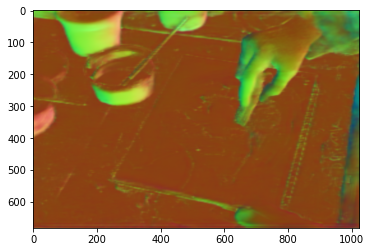

/home/wfchen/OASIS_trainval/image/247287_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257186_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249778_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250198_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239777_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249100_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238403_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246903_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/258151_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237066_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268145_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255230_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/262459_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/244493_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/242630_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248546_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268050_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261125_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239798_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255237_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249833_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254248_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232525_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/266277_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251001_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238881_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239389_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251536_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/251558_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253107_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/229563_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265909_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237204_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265822_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/264305_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239397_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255371_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/258769_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/263982_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242051_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239856_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238202_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/256733_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254814_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/267649_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/264477_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251809_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249308_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232888_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232880_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254020_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268245_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/262808_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254122_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/233548_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/263301_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/238558_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248012_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247284_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253970_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269748_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265575_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256588_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/227308_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268880_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246054_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237800_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242053_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242071_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254664_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/254972_DT.png front facing = False
/home/wfchen/OASIS_trainval/image/255024_DT.png front facing = False
/home/wfchen/OASIS_trainval/image/243621_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/236686_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251252_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259750_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261807_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247512_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246671_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261553_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252468_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242999_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238582_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241417_ALI.png front facing = False
/home/wfchen/OASIS_tra

/home/wfchen/OASIS_trainval/image/254421_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/233953_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256605_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252557_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241324_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/230172_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255137_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252323_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237921_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247850_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246613_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248303_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269957_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260126_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/243848_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232963_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255482_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/262103_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232811_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243703_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251380_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238577_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/258641_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249800_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253948_ALI.png front facing = False
:/
/home/wfchen/OASIS_trainval/image/240747_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/244110_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269186_ALI.png front facing = False
/home/wfchen/OASI

/home/wfchen/OASIS_trainval/image/240555_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256113_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241102_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239047_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/218258_DT.png front facing = False
/home/wfchen/OASIS_trainval/image/254416_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/262212_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253912_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269387_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257761_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/245717_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252040_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259086_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/267355_ALI.png front facing = False
/home/wfchen/OASIS_tr

/home/wfchen/OASIS_trainval/image/257841_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/264898_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268075_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243049_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242235_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/227651_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269420_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/240215_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259929_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256862_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242066_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268861_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247809_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250130_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/246874_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/245930_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/229924_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247386_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/236420_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243946_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/244538_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268498_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261632_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265001_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265045_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249193_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257475_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251152_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/259475_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243560_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252413_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/233947_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239696_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/264408_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242948_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247152_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242315_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241467_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/240179_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/92174_DT.png front facing = False
/home/wfchen/OASIS_trainval/image/235706_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/119500_DT.png front facing = False
/home/wfchen/OASIS_trai

/home/wfchen/OASIS_trainval/image/257230_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/270082_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248023_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232978_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261670_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/244195_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241938_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/245314_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249477_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248046_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252378_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/234560_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254898_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/240913_DT.png front facing = False
/home/wfchen/OASIS_tr

/home/wfchen/OASIS_trainval/image/247143_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265108_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248433_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/264849_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253363_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247579_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249233_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261266_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232947_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265093_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/229282_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255299_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248402_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/269652_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/262892_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268821_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249149_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/254484_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249109_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249693_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/227898_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247248_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247768_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/230602_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239885_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238427_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255990_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260261_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/243808_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/266800_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237579_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243655_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247431_DT.png front facing = False
/home/wfchen/OASIS_trainval/image/239521_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/231798_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251749_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238715_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/228593_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/245008_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/266489_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248498_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/210921_DT.png front facing = False
/home/wfchen/OASIS_tra

/home/wfchen/OASIS_trainval/image/229178_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249002_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/236511_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/244969_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268125_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/240352_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/255093_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/251003_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256008_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/236091_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265683_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/229064_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/234935_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/230123_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/237677_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/265826_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237738_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/242947_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/231289_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/253389_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/256982_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/239614_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237782_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243066_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237423_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232024_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261754_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/260370_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/233242_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/249714_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247624_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/258714_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/236290_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250221_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/257130_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259978_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246155_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259571_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/238477_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/221710_DT.png front facing = False
/home/wfchen/OASIS_trainval/image/233086_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/237473_ALI.png front facing = False
/home/wfchen/OASIS_tr

/home/wfchen/OASIS_trainval/image/242425_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/241897_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/246077_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268697_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/230553_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232283_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/244647_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/231027_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/232445_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/245711_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250157_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248493_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/231188_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/261764_ALI.png front facing = False
/home/wfchen/OASIS_t

/home/wfchen/OASIS_trainval/image/264668_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/234529_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/262948_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/230110_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/231576_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248310_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/259393_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/268879_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/248628_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/247638_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/267421_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/243963_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/252957_ALI.png front facing = False
/home/wfchen/OASIS_trainval/image/250609_ALI.png front facing = False
/home/wfchen/OASIS_t

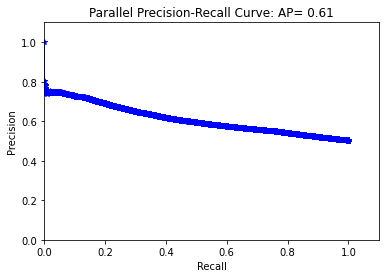

In [104]:
perpendi_ang_diffs = []
parallel_ang_diffs = []
neither_ang_diffs = []

image_pairs_map = defaultdict(list)
for line in open(test_file, 'r'):
    im_name, y_A, x_A, y_B, x_B, rel = line.strip().split(',')
    x_A = int(x_A)
    y_A = int(y_A)
    x_B = int(x_B)
    y_B = int(y_B)

    image_pairs_map[im_name].append((x_A, y_A, x_B, y_B, rel))
    
# Predict normals
for idx, im_name in enumerate(image_pairs_map):
#     color = cv2.imread(im_name).astype(np.float32)
    img_path = os.path.join('/scratch/ainaz/OASIS/OASIS_trainval/image/', im_name.split('/')[-1])
    color = np.array(Image.open(img_path)).astype(np.float32) # my code
    if len(color.shape) < 3:
        print(":/")
        continue
    anno_id = im_name.split('/')[-1].replace('.png', '')
    orig_height, orig_width = color.shape[:2]
    color = cv2.resize(color, (256, 256))
    color = np.transpose(color, (2, 0, 1)) / 255.0
    color = torch.tensor(color).to(device).unsqueeze(0)
    
    print(im_name, "front facing = %s" % front_facing)

    output = model(color)
    
    #### blind guess
#     transform_blind = transforms.Compose([
#         transforms.Resize(256, Image.NEAREST),
#         transforms.ToTensor()
#     ])
#     blind = transform_blind(
#         Image.open('/scratch/ainaz/omnidata2/blind_guesses/normal_taskonomy.png'))
#     output = blind.unsqueeze(0).cuda()
    ################
    
    # Resize to groundtruth resolution
    output = torch.nn.functional.interpolate(output, (orig_height, orig_width), mode='bilinear')
    
    output = torch.clamp(output, 0, 1) # my code
    
    output = output.cpu().detach().numpy()
    
    ####
    if idx == 500:
        print(output.shape)
        im = output.squeeze().transpose(1, 2, 0) * 255.0
        plt.imshow(np.uint8(im))
        plt.show()
#         break
    ####
    
#     coord_change = [1.0, 1.0, -1.0]
#     output[:,0,:,:] *= coord_change[0]
#     output[:,1,:,:] *= coord_change[1]
#     output[:,2,:,:] *= coord_change[2]
    
    # Model does inference on 4D tensor, but eval function takes 3D
    # Has to be HxWx3
    output = np.transpose(output[0,:,:,:], (1,2,0))
    
    if front_facing:
        output[:,:,0] = 0
        output[:,:,1] = 0
        output[:,:,2] = 1

    _perpendi, _parallel, _neither = get_ang_diffs(pred_normal = output, xyxyr_tups = image_pairs_map[im_name])
    perpendi_ang_diffs += _perpendi
    parallel_ang_diffs += _parallel
    neither_ang_diffs  += _neither

print('Evaluating:', idx)
perpendi_AP, parallel_AP = eval_rel_normal_by_ang(perpendi_ang_diffs, parallel_ang_diffs, neither_ang_diffs)  
print('Perpendicular AP: {}, Parallel AP: {}'.format(perpendi_AP, parallel_AP))


# Eval test

In [11]:
def run(model, list_of_imgs, out_folder, b_vis_normal=False):
  
    print("####################################")
    print("Infering... Saving to %s" % out_folder)

    assert not model.training

    iter = 0
    with torch.no_grad():
        for img_fname in tqdm(list_of_imgs):
            ################################################
#             color = cv2.imread(img_fname).astype(np.float32)
            img_path = os.path.join('/scratch/ainaz/OASIS/OASIS_test/image/', img_fname.split('/')[-1])
            color = np.array(Image.open(img_path)).astype(np.float32)
            target_res = color.shape[:2]
            color = cv2.resize(color, (256, 256))
            color = color.transpose(2, 0, 1).astype(np.float32) / 255.0	

            color = np.expand_dims(color, axis = 0)
            inputs = torch.from_numpy(color)

            input_var = Variable(inputs.to(device))
            output_var = model(input_var)
            # output_var = torch.nn.functional.normalize(output_var, p=2, dim=1)
            
            #### my code
            output_var = torch.clamp(output_var, 0, 1)
            output_var[:,:,2] *= -1 
            ######

            pred_np = output_var.cpu().detach().numpy()[0,:,:,:]
            pred_np = pred_np.transpose(1, 2, 0)
      
    

            #######################################################################
            # save to output folder
            # orig_size_pred_np = cv2.resize(pred_np, (target_res[1], target_res[0]))
            img_id = os.path.basename(img_fname).replace(".png", "")      
            np.save("%s/%s.npy" % (out_folder, img_id), pred_np)
            # print("Done saving to %s/%s.npy" % (out_folder, img_id))

            if b_vis_normal:
#                 vis = (pred_np + 1.0) / 2.0 * 255.0
                vis = (pred_np * 255.0)
#                 cv2.imwrite("%s/%s.png" % (out_folder, img_id), vis.astype(np.uint8))
                plt.imshow(vis.astype(np.uint8))
                plt.show()


def get_img_list(csv_filename):
    img_names = []
  
    with open(csv_filename, "r") as f:
        lines = [line.strip() for line in f]
        lines = lines[1:] 
  
    for line in lines:
        splits = line.split(",")
        if splits[-1] != '' and splits[4] != '':
            img_names.append(splits[0])
    
    return img_names

  0%|          | 0/20000 [00:00<?, ?it/s]

Testing on /scratch/ainaz/OASIS/OASIS_test/OASIS_test.csv
####################################
Infering... Saving to /scratch/ainaz/OASIS/normals


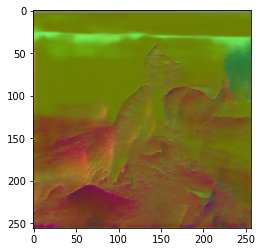

  0%|          | 1/20000 [00:00<58:06,  5.74it/s]

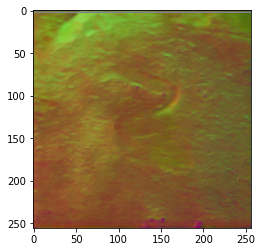

  0%|          | 2/20000 [00:00<58:26,  5.70it/s]

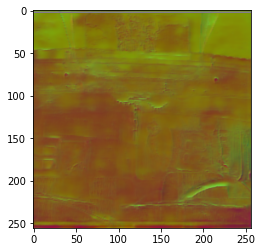

  0%|          | 3/20000 [00:00<1:09:46,  4.78it/s]

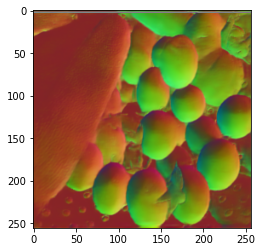

  0%|          | 4/20000 [00:00<1:05:42,  5.07it/s]

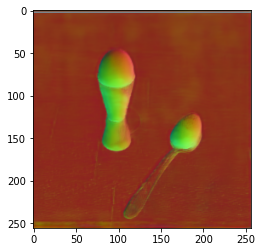

  0%|          | 5/20000 [00:00<1:02:05,  5.37it/s]

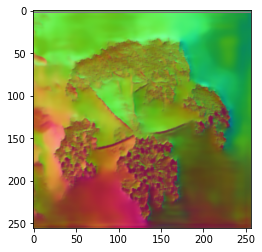

  0%|          | 6/20000 [00:01<59:03,  5.64it/s]  

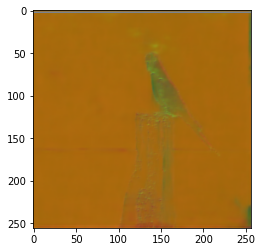

  0%|          | 7/20000 [00:01<57:25,  5.80it/s]

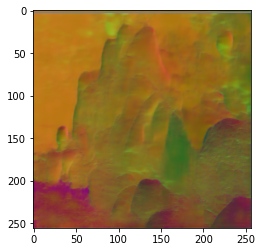

  0%|          | 8/20000 [00:01<56:03,  5.94it/s]

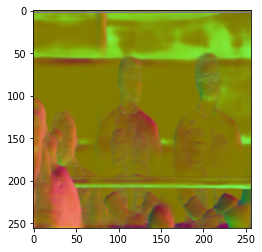

  0%|          | 9/20000 [00:01<54:56,  6.06it/s]

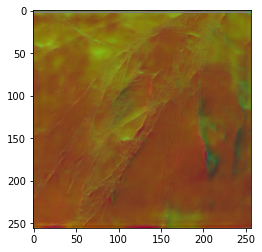

  0%|          | 10/20000 [00:01<55:16,  6.03it/s]

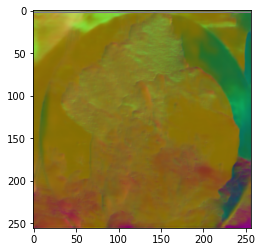

  0%|          | 11/20000 [00:01<54:43,  6.09it/s]

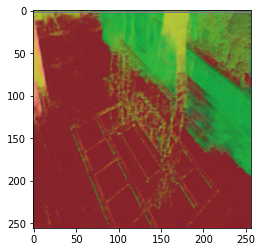

  0%|          | 12/20000 [00:02<54:40,  6.09it/s]

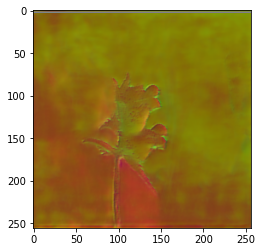

  0%|          | 13/20000 [00:02<53:42,  6.20it/s]

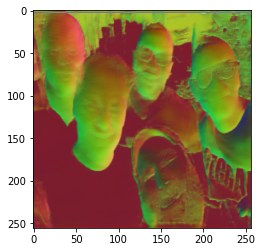

  0%|          | 14/20000 [00:02<53:34,  6.22it/s]

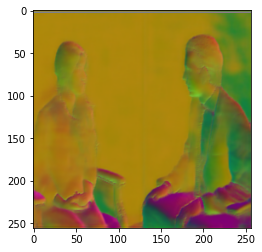

  0%|          | 15/20000 [00:02<56:54,  5.85it/s]

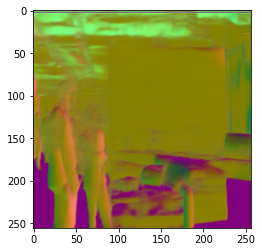

  0%|          | 16/20000 [00:02<55:23,  6.01it/s]

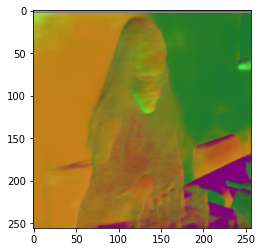

  0%|          | 17/20000 [00:02<53:42,  6.20it/s]

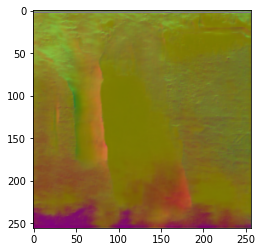

  0%|          | 18/20000 [00:03<55:02,  6.05it/s]

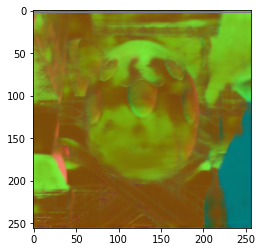

  0%|          | 19/20000 [00:03<54:57,  6.06it/s]

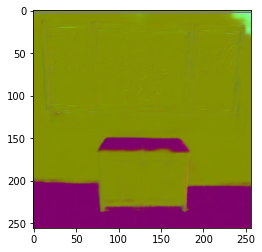

  0%|          | 20/20000 [00:03<54:15,  6.14it/s]

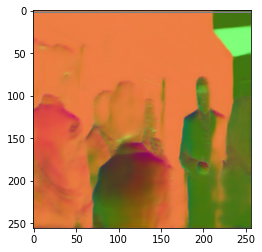

  0%|          | 21/20000 [00:03<53:45,  6.19it/s]

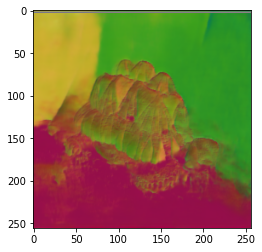

  0%|          | 22/20000 [00:03<1:04:45,  5.14it/s]

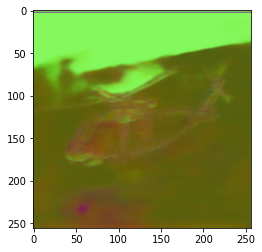

  0%|          | 23/20000 [00:03<1:00:12,  5.53it/s]

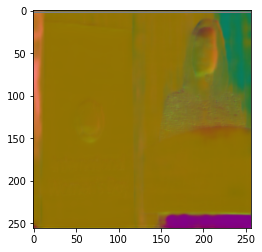

  0%|          | 24/20000 [00:04<57:19,  5.81it/s]  

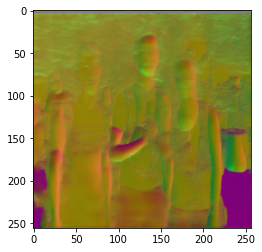

  0%|          | 25/20000 [00:04<56:58,  5.84it/s]

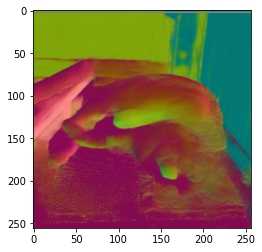

  0%|          | 26/20000 [00:04<57:50,  5.76it/s]

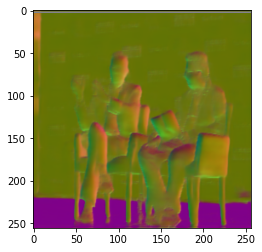

  0%|          | 27/20000 [00:04<56:47,  5.86it/s]

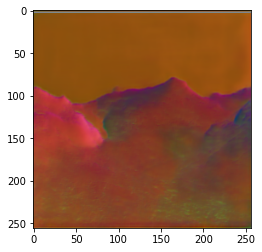

  0%|          | 28/20000 [00:04<54:31,  6.11it/s]

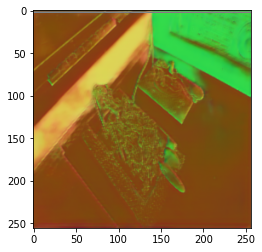

  0%|          | 29/20000 [00:04<53:35,  6.21it/s]

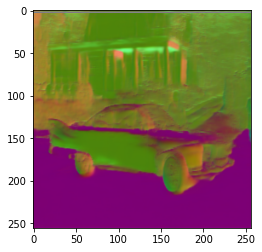

  0%|          | 30/20000 [00:05<52:58,  6.28it/s]

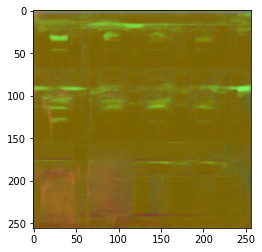

  0%|          | 31/20000 [00:05<53:32,  6.22it/s]

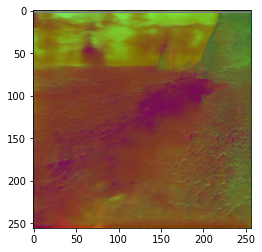

  0%|          | 32/20000 [00:05<54:20,  6.12it/s]

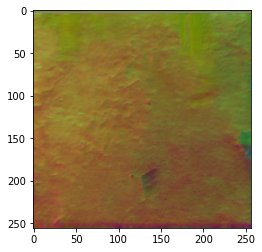

  0%|          | 33/20000 [00:05<54:41,  6.09it/s]

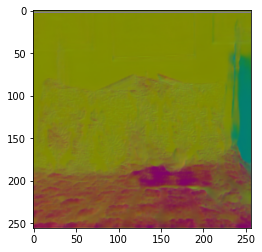

  0%|          | 34/20000 [00:05<55:20,  6.01it/s]

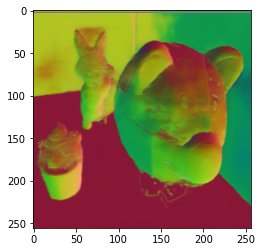

  0%|          | 35/20000 [00:05<54:55,  6.06it/s]

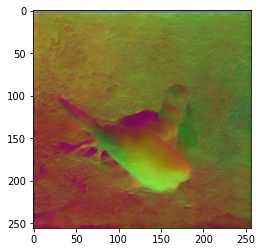

  0%|          | 36/20000 [00:06<56:57,  5.84it/s]

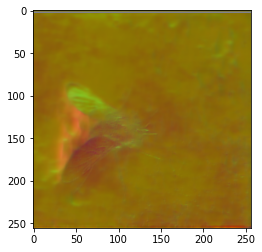

  0%|          | 37/20000 [00:06<55:32,  5.99it/s]

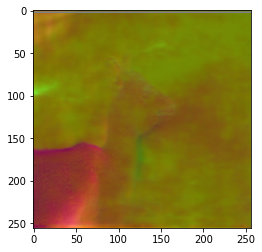

  0%|          | 38/20000 [00:06<53:59,  6.16it/s]

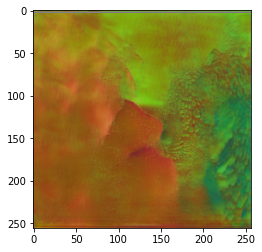

  0%|          | 39/20000 [00:06<54:37,  6.09it/s]

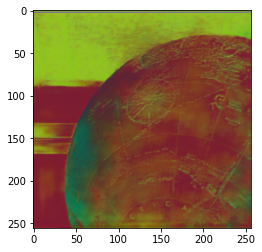

  0%|          | 40/20000 [00:06<55:07,  6.03it/s]

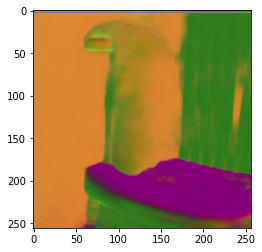

  0%|          | 41/20000 [00:07<1:05:49,  5.05it/s]

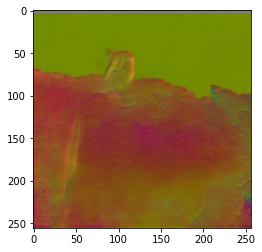

  0%|          | 42/20000 [00:07<1:02:45,  5.30it/s]

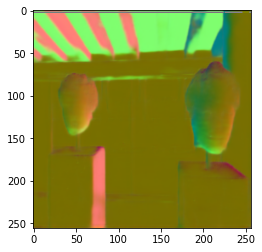

  0%|          | 43/20000 [00:07<59:18,  5.61it/s]  

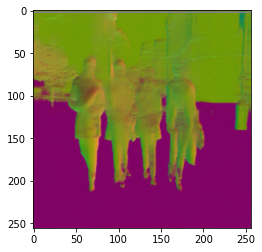

  0%|          | 44/20000 [00:07<57:34,  5.78it/s]

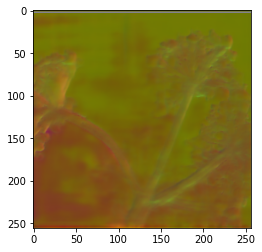

  0%|          | 45/20000 [00:07<56:19,  5.90it/s]

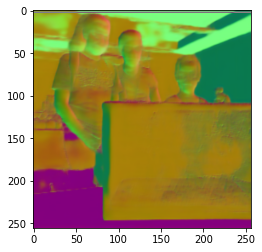

  0%|          | 46/20000 [00:07<55:51,  5.95it/s]

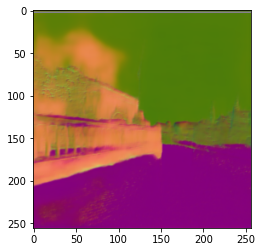

  0%|          | 47/20000 [00:08<53:58,  6.16it/s]

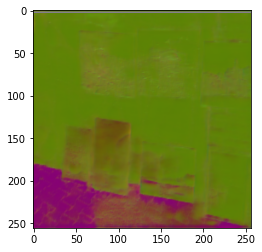

  0%|          | 48/20000 [00:08<53:23,  6.23it/s]

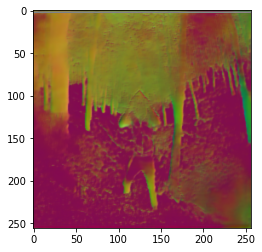

  0%|          | 49/20000 [00:08<53:53,  6.17it/s]

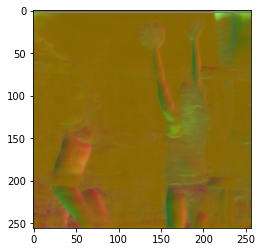

  0%|          | 50/20000 [00:08<53:30,  6.21it/s]

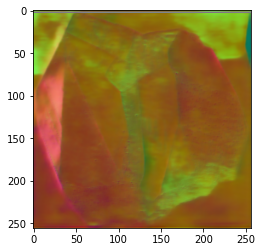

  0%|          | 51/20000 [00:08<54:06,  6.15it/s]

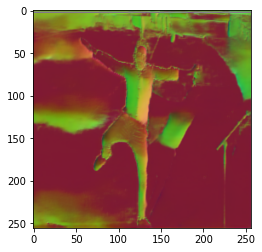

  0%|          | 52/20000 [00:08<52:54,  6.28it/s]

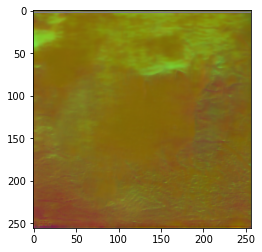

  0%|          | 53/20000 [00:08<54:58,  6.05it/s]

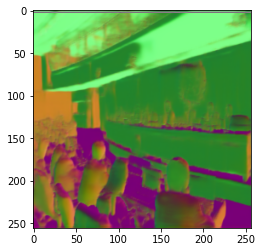

  0%|          | 54/20000 [00:09<54:08,  6.14it/s]

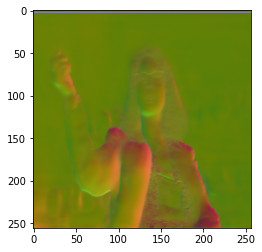

  0%|          | 55/20000 [00:09<52:47,  6.30it/s]

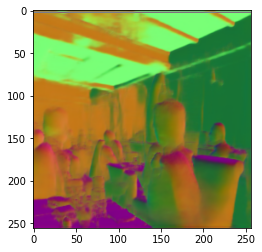

  0%|          | 56/20000 [00:09<53:08,  6.26it/s]

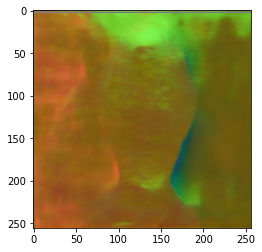

  0%|          | 57/20000 [00:09<52:38,  6.31it/s]

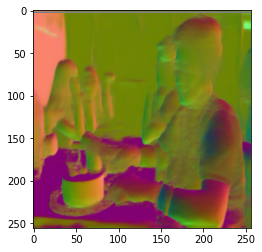

  0%|          | 58/20000 [00:09<53:17,  6.24it/s]

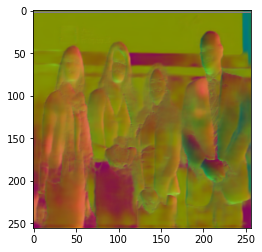

  0%|          | 59/20000 [00:09<53:42,  6.19it/s]

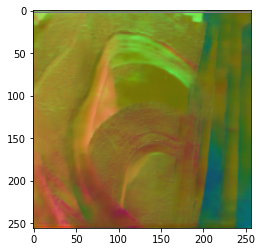

  0%|          | 60/20000 [00:10<1:04:14,  5.17it/s]

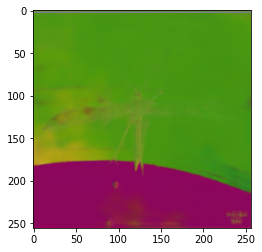

  0%|          | 61/20000 [00:10<1:00:17,  5.51it/s]

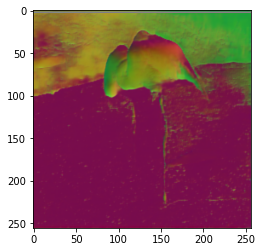

  0%|          | 62/20000 [00:10<1:00:32,  5.49it/s]

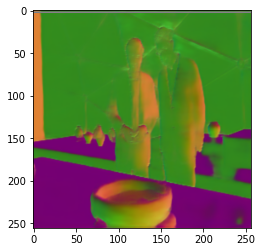

  0%|          | 63/20000 [00:10<57:28,  5.78it/s]  

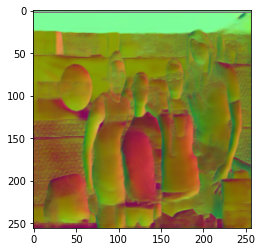

  0%|          | 64/20000 [00:10<56:50,  5.85it/s]

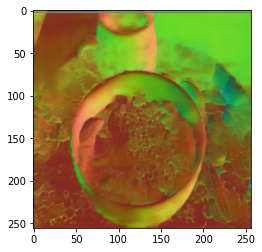

  0%|          | 65/20000 [00:11<56:08,  5.92it/s]

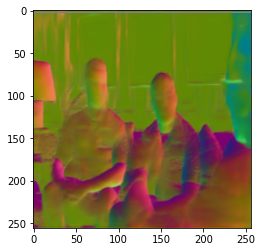

  0%|          | 66/20000 [00:11<55:05,  6.03it/s]

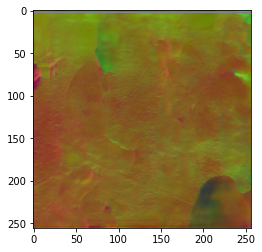

  0%|          | 67/20000 [00:11<58:38,  5.66it/s]

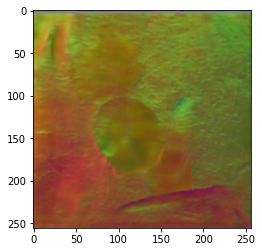

  0%|          | 68/20000 [00:11<1:00:19,  5.51it/s]

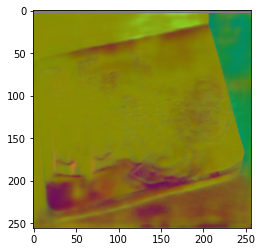

  0%|          | 69/20000 [00:11<59:35,  5.57it/s]  

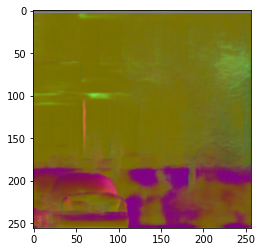

  0%|          | 70/20000 [00:11<58:16,  5.70it/s]

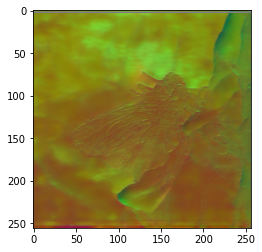

  0%|          | 71/20000 [00:12<57:18,  5.80it/s]

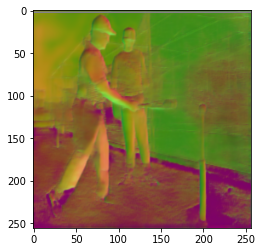

  0%|          | 72/20000 [00:12<56:29,  5.88it/s]

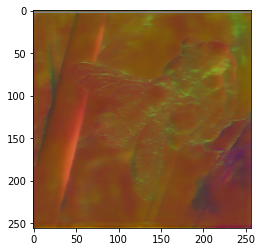

  0%|          | 73/20000 [00:12<58:06,  5.72it/s]

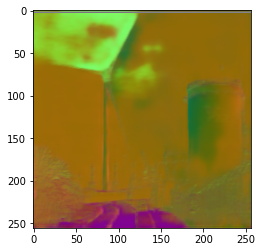

  0%|          | 74/20000 [00:12<1:00:39,  5.48it/s]

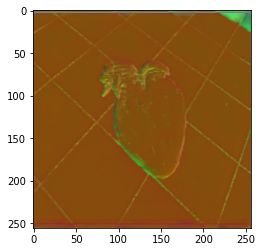

  0%|          | 75/20000 [00:12<1:01:00,  5.44it/s]

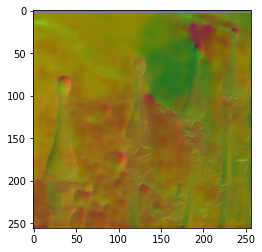

  0%|          | 76/20000 [00:12<58:09,  5.71it/s]  

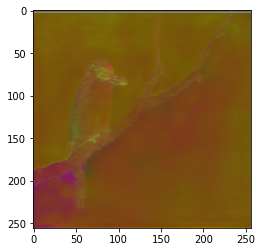

  0%|          | 77/20000 [00:13<56:17,  5.90it/s]

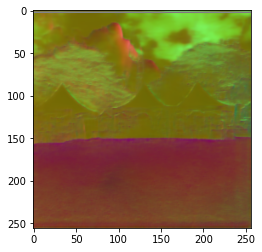

  0%|          | 78/20000 [00:13<56:06,  5.92it/s]

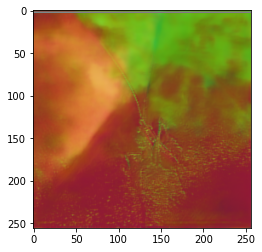

  0%|          | 79/20000 [00:13<1:10:40,  4.70it/s]

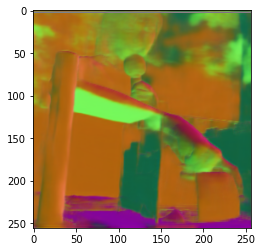

  0%|          | 80/20000 [00:13<1:06:51,  4.97it/s]

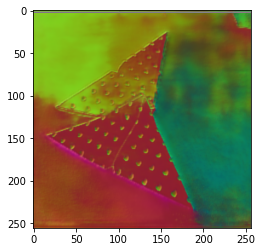

  0%|          | 81/20000 [00:13<1:02:33,  5.31it/s]

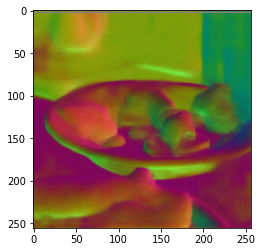

  0%|          | 82/20000 [00:14<1:00:08,  5.52it/s]

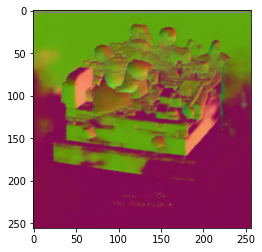

  0%|          | 83/20000 [00:14<57:53,  5.73it/s]  

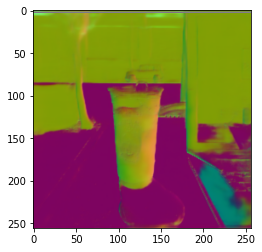

  0%|          | 84/20000 [00:14<55:57,  5.93it/s]

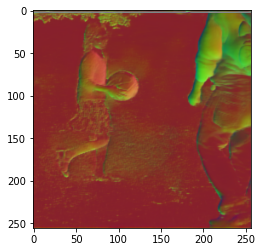

  0%|          | 85/20000 [00:14<56:10,  5.91it/s]

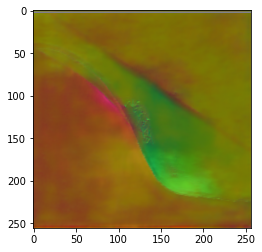

  0%|          | 86/20000 [00:14<55:16,  6.00it/s]

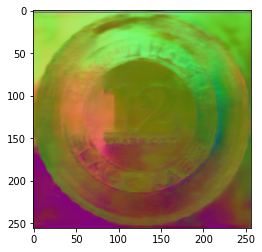

  0%|          | 87/20000 [00:14<55:50,  5.94it/s]

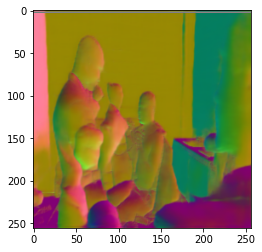

  0%|          | 88/20000 [00:15<54:29,  6.09it/s]

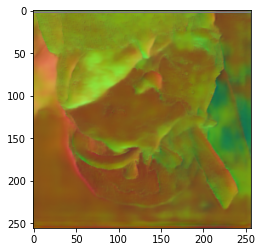

  0%|          | 89/20000 [00:15<54:40,  6.07it/s]

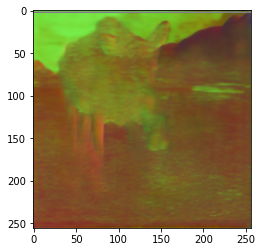

  0%|          | 90/20000 [00:15<55:10,  6.01it/s]

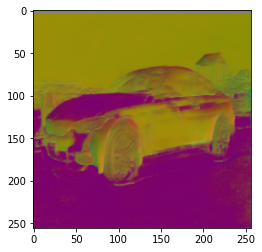

  0%|          | 91/20000 [00:15<54:12,  6.12it/s]

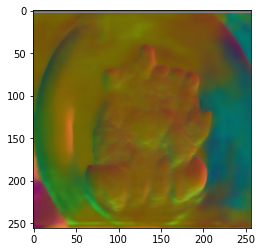

  0%|          | 92/20000 [00:15<53:19,  6.22it/s]

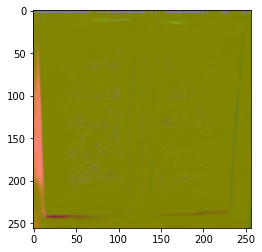

  0%|          | 93/20000 [00:15<52:15,  6.35it/s]

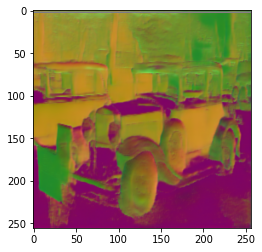

  0%|          | 94/20000 [00:16<52:48,  6.28it/s]

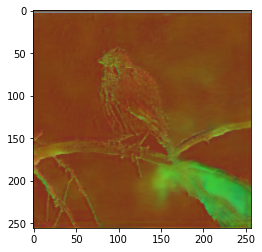

  0%|          | 95/20000 [00:16<52:30,  6.32it/s]

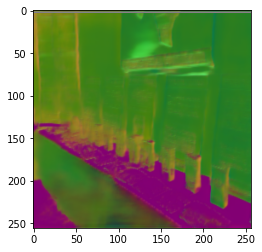

  0%|          | 96/20000 [00:16<53:13,  6.23it/s]

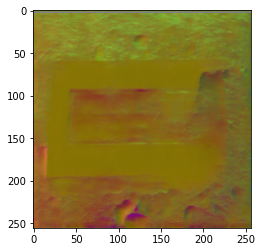

  0%|          | 97/20000 [00:16<53:49,  6.16it/s]

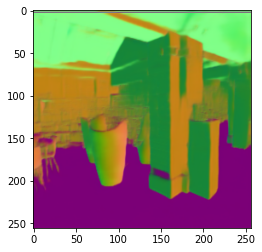

  0%|          | 98/20000 [00:16<1:03:42,  5.21it/s]

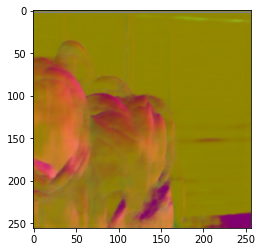

  0%|          | 99/20000 [00:16<59:38,  5.56it/s]  

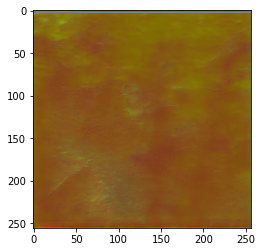

  0%|          | 100/20000 [00:17<59:36,  5.56it/s]

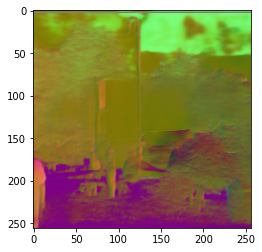

  1%|          | 101/20000 [00:17<1:00:22,  5.49it/s]

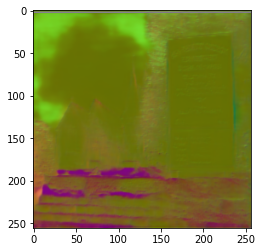

  1%|          | 102/20000 [00:17<58:06,  5.71it/s]  

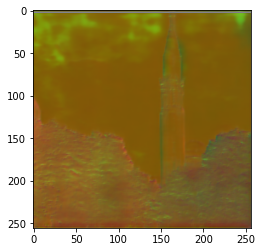

  1%|          | 103/20000 [00:17<56:03,  5.92it/s]

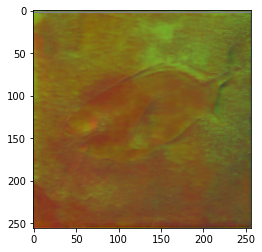

  1%|          | 104/20000 [00:17<55:58,  5.92it/s]

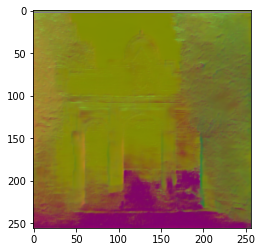

  1%|          | 105/20000 [00:17<55:07,  6.01it/s]

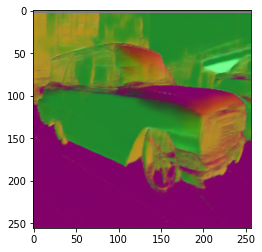

  1%|          | 106/20000 [00:18<53:54,  6.15it/s]

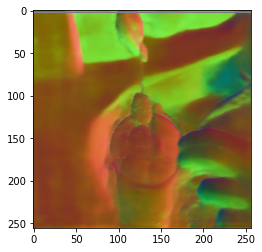

  1%|          | 107/20000 [00:18<53:26,  6.20it/s]

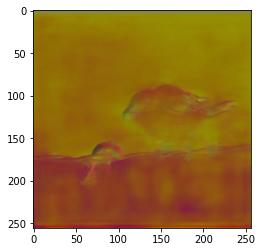

  1%|          | 108/20000 [00:18<52:44,  6.29it/s]

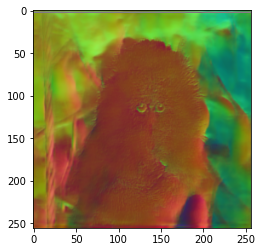

  1%|          | 109/20000 [00:18<53:04,  6.25it/s]

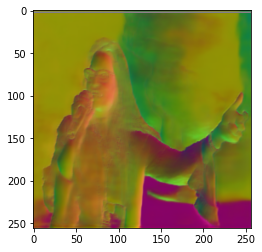

  1%|          | 110/20000 [00:18<53:07,  6.24it/s]

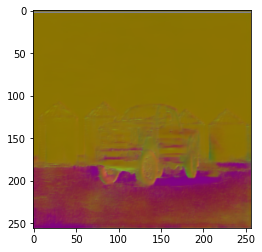

  1%|          | 111/20000 [00:18<52:26,  6.32it/s]

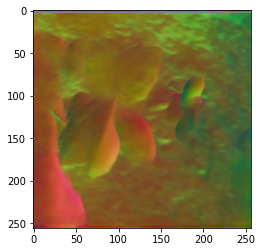

  1%|          | 112/20000 [00:19<52:56,  6.26it/s]

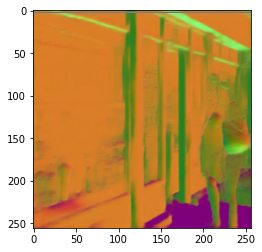

  1%|          | 113/20000 [00:19<53:16,  6.22it/s]

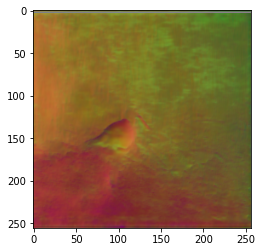

  1%|          | 114/20000 [00:19<53:10,  6.23it/s]

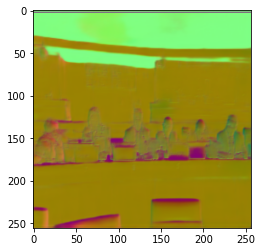

  1%|          | 115/20000 [00:19<52:23,  6.33it/s]

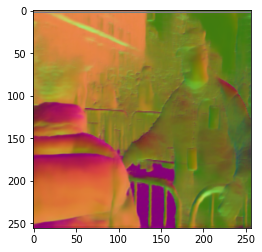

  1%|          | 116/20000 [00:19<54:03,  6.13it/s]

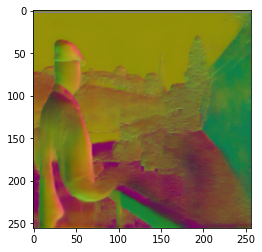

  1%|          | 117/20000 [00:19<1:04:16,  5.16it/s]

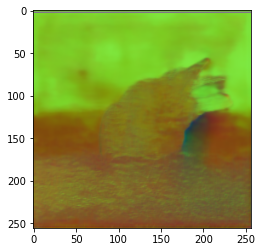

  1%|          | 118/20000 [00:20<1:00:51,  5.44it/s]

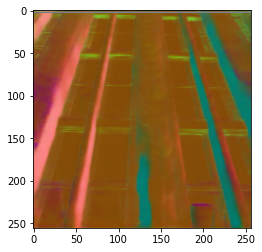

  1%|          | 119/20000 [00:20<58:49,  5.63it/s]  

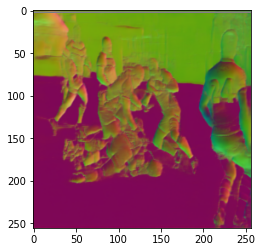

  1%|          | 120/20000 [00:20<56:49,  5.83it/s]

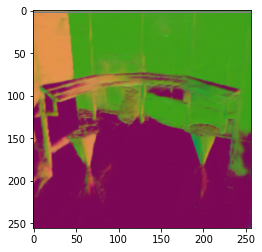

  1%|          | 121/20000 [00:20<55:09,  6.01it/s]

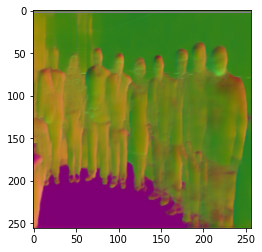

  1%|          | 122/20000 [00:20<54:16,  6.10it/s]

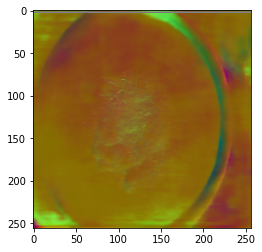

  1%|          | 123/20000 [00:20<53:54,  6.15it/s]

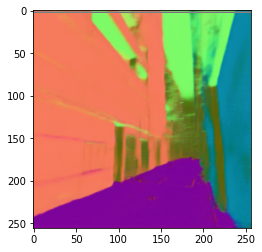

  1%|          | 124/20000 [00:21<53:30,  6.19it/s]

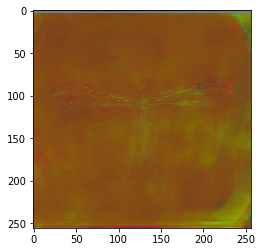

  1%|          | 125/20000 [00:21<54:42,  6.06it/s]

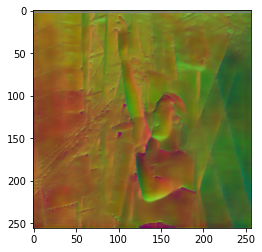

  1%|          | 126/20000 [00:21<55:11,  6.00it/s]

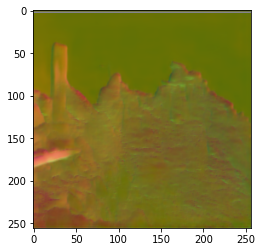

  1%|          | 127/20000 [00:21<54:27,  6.08it/s]

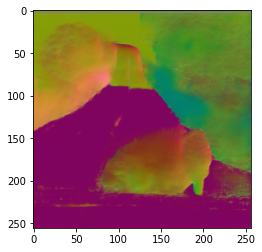

  1%|          | 128/20000 [00:21<55:13,  6.00it/s]

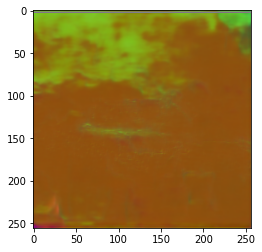

  1%|          | 129/20000 [00:21<57:48,  5.73it/s]

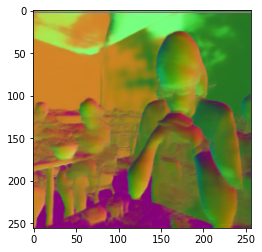

  1%|          | 130/20000 [00:22<56:43,  5.84it/s]

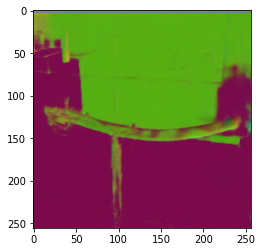

  1%|          | 131/20000 [00:22<54:16,  6.10it/s]

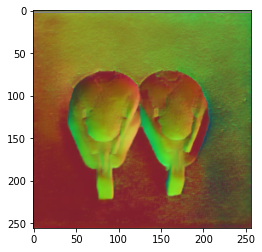

  1%|          | 132/20000 [00:22<54:24,  6.09it/s]

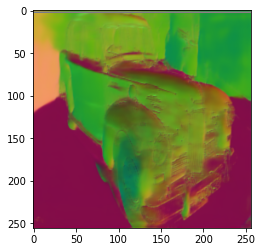

  1%|          | 133/20000 [00:22<57:00,  5.81it/s]

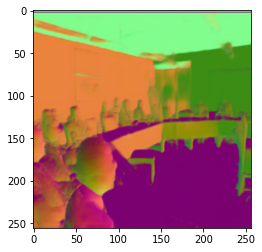

  1%|          | 134/20000 [00:22<54:40,  6.06it/s]

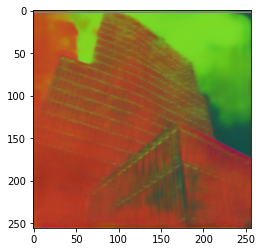

  1%|          | 135/20000 [00:22<54:46,  6.04it/s]

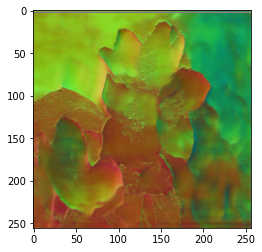

  1%|          | 136/20000 [00:23<1:07:27,  4.91it/s]

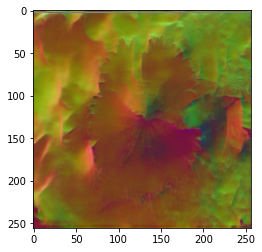

  1%|          | 137/20000 [00:23<1:03:16,  5.23it/s]

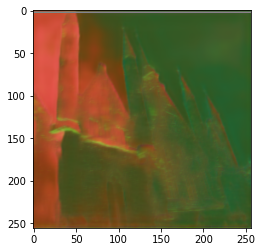

  1%|          | 138/20000 [00:23<59:53,  5.53it/s]  

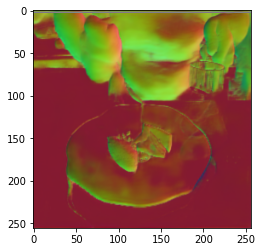

  1%|          | 139/20000 [00:23<57:12,  5.79it/s]

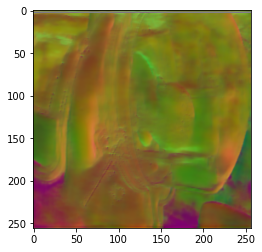

  1%|          | 140/20000 [00:23<55:58,  5.91it/s]

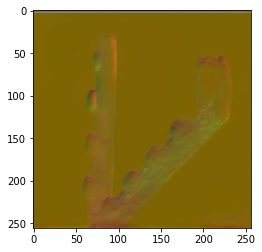

  1%|          | 141/20000 [00:24<53:30,  6.19it/s]

In [ ]:
test_csv = '/scratch/ainaz/OASIS/OASIS_test/OASIS_test.csv'
out_folder = '/scratch/ainaz/OASIS/normals'
list_of_imgs = get_img_list(test_csv)
print( "Testing on %s" % test_csv )
run(model, list_of_imgs, out_folder, False)

In [ ]:
test_csv = '/scratch/ainaz/OASIS/OASIS_test/OASIS_test.csv'
out_folder = '/scratch/ainaz/OASIS/normals'
list_of_imgs = get_img_list(test_csv)
print( "Testing on %s" % test_csv )
run(model, list_of_imgs, out_folder, False)

  0%|          | 1/20000 [00:00<39:08,  8.51it/s]

Testing on /scratch/ainaz/OASIS/OASIS_test/OASIS_test.csv
####################################
Infering... Saving to /scratch/ainaz/OASIS/normals


 50%|█████     | 10041/20000 [07:06<06:55, 23.95it/s]